# Solar Panels segmentation U-Net


# I. Import libraries
___

In [3]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [4]:
import numpy as np 
import pandas as pd 
import shutil
import tensorflow as tf
from zipfile import ZipFile 
import keras.backend as K
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os
from PIL import Image

# II. Utility Functions
---

In [5]:
def prepare_dataframe(image_path, name):
    solar_ids = []
    paths = []
    for dirname, _, filenames in os.walk(image_path):
        for filename in filenames:
            path = os.path.join(dirname, filename)    
            paths.append(path)

            solar_id = filename.split(".")[0]
            solar_ids.append(solar_id)

    d = {"id": solar_ids, name: paths}
    df = pd.DataFrame(data = d)
    df = df.set_index('id')
    return df

In [6]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

# III. Dataset Preparation
___

In [14]:
!mkdir train
!mkdir train_masks

mkdir: cannot create directory ‘train’: File exists
mkdir: cannot create directory ‘train_masks’: File exists


In [19]:
#copy all images to image folder and save labels to label folder with same name as correspoding image

root_dir = '/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/solar/PV03'
resolution = 'PV03'
data_dir = os.path.join(root_dir)#,resolution)

image_root = '/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/solar/PV03/try/train'
label_root = '/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/solar/PV03/try/train_masks'
if not os.path.isdir(image_root):
    os.mkdir(image_root)
if not os.path.isdir(label_root):
    os.mkdir(label_root)

images = list()
labels = list()

for (dirpath, dirnames, filenames) in os.walk(data_dir):
    # img_names += [os.path.join(dirpath, file) for file in filenames]
    images += [os.path.join(dirpath, file) for file in filenames]

labels += [i for i in filter(lambda score: '_label.bmp' in score, images)]
images = [i for i in filter(lambda score: '_label.bmp' not in score, images)]

for img_path in images:
    src_path = img_path
    dst_path = os.path.join(image_root,os.path.basename(img_path))
    img = Image.open(src_path)
    new_img = img.resize( (256, 256) )
    new_img.save( dst_path[:-4]+'.png', 'png')

for label_path in labels:
    src_path = label_path
    file_name = os.path.basename(label_path).replace('_label','')
    dst_path = os.path.join(label_root,file_name)
    img = Image.open(src_path)
    new_img = img.resize( (256, 256) )
    new_img.save( dst_path[:-4]+'.png', 'png')

In [21]:
print("Train set:  ", len(os.listdir("/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/solar/PV03/try/train")))
print("Train masks:", len(os.listdir("/home/jovyan/shared/Learning_materials/subsections/1.*/code/data/solar/PV03/try/train_masks")))

Train set:   2308
Train masks: 2308


In [22]:
df = prepare_dataframe('/home/jovyan/shared/Learning materials/subsections/1.*/code/data/solar/PV03/try/train', "solar_path")
mask_df = prepare_dataframe('/home/jovyan/shared/Learning materials/subsections/1.*/code/data/solar/PV03/try/train_masks', "mask_path")
df["mask_path"] = mask_df["mask_path"]

# IV. Data Pre-processing and Augmentation
___

Now we will perform a simple augmentation of flipping an image and then normalize the image pixel in between 0 and 1

In [29]:
img_size = [256,256]

def data_augmentation(solar_img, mask_img):

    if tf.random.uniform(()) > 0.5:
        solar_img = tf.image.flip_left_right(solar_img)
        mask_img = tf.image.flip_left_right(mask_img)

    return solar_img, mask_img

def preprocessing(solar_path, mask_path):
    solar_img = tf.io.read_file(solar_path) 
    solar_img = tf.image.decode_jpeg(solar_img, channels=3)
    solar_img = tf.image.resize(solar_img, img_size)
    solar_img = tf.cast(solar_img, tf.float32) / 255.0
    
    mask_img = tf.io.read_file(mask_path)
    mask_img = tf.image.decode_jpeg(mask_img, channels=3)
    mask_img = tf.image.resize(mask_img, img_size)
    mask_img = mask_img[:,:,:1]    
    mask_img = tf.math.sign(mask_img)
    
    
    return solar_img, mask_img

def create_dataset(df, train = False):
    if not train:
        ds = tf.data.Dataset.from_tensor_slices((df["solar_path"].values, df["mask_path"].values))
        ds = ds.map(preprocessing, tf.data.AUTOTUNE)
    else:
        ds = tf.data.Dataset.from_tensor_slices((df["solar_path"].values, df["mask_path"].values))
        ds = ds.map(preprocessing, tf.data.AUTOTUNE)
        ds = ds.map(data_augmentation, tf.data.AUTOTUNE)

    return ds

In [30]:
# Now we will split the dataset into train and test
train_df, valid_df = train_test_split(df, random_state=42, test_size=.25)
train = create_dataset(train_df, train = True)
valid = create_dataset(valid_df)

ValueError: With n_samples=0, test_size=0.25 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

In [26]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [27]:
TRAIN_LENGTH = len(train_df)
BATCH_SIZE = 24
BUFFER_SIZE = 1000

NameError: name 'train_df' is not defined

In [19]:
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
valid_dataset = valid.batch(BATCH_SIZE)

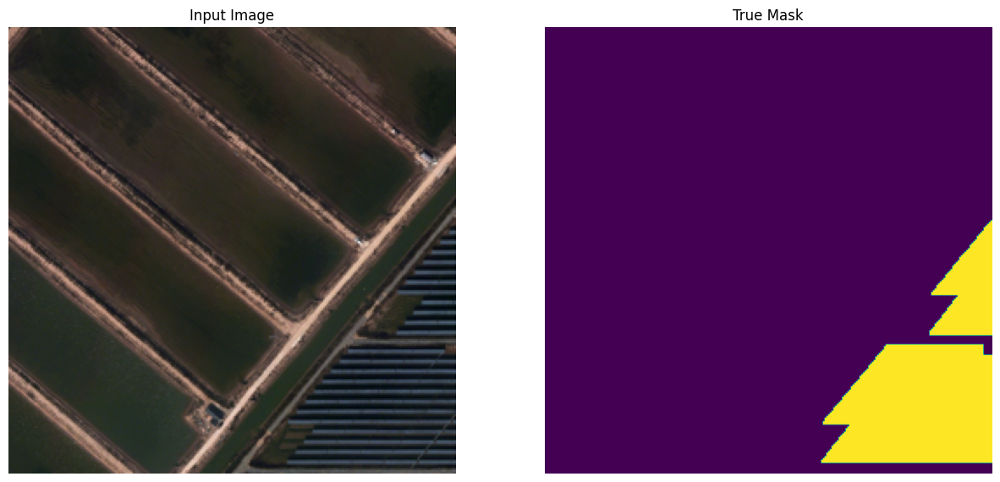

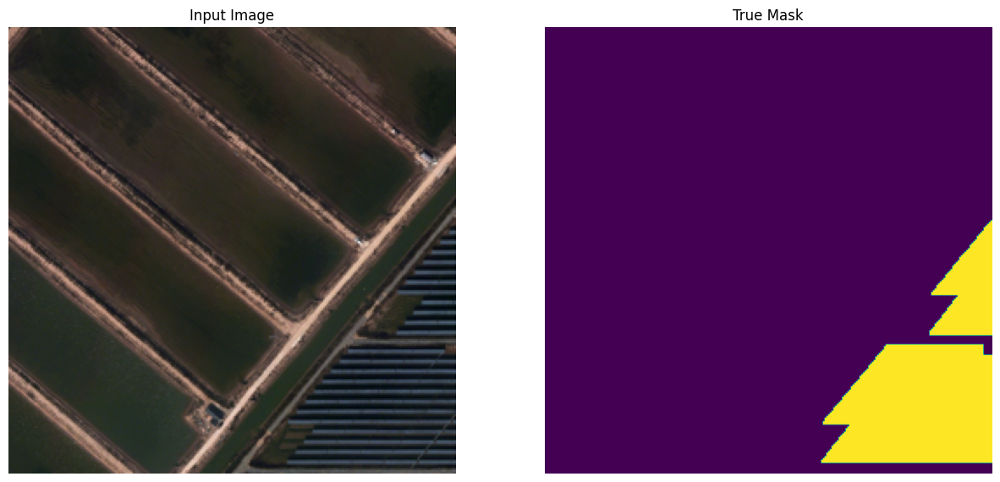

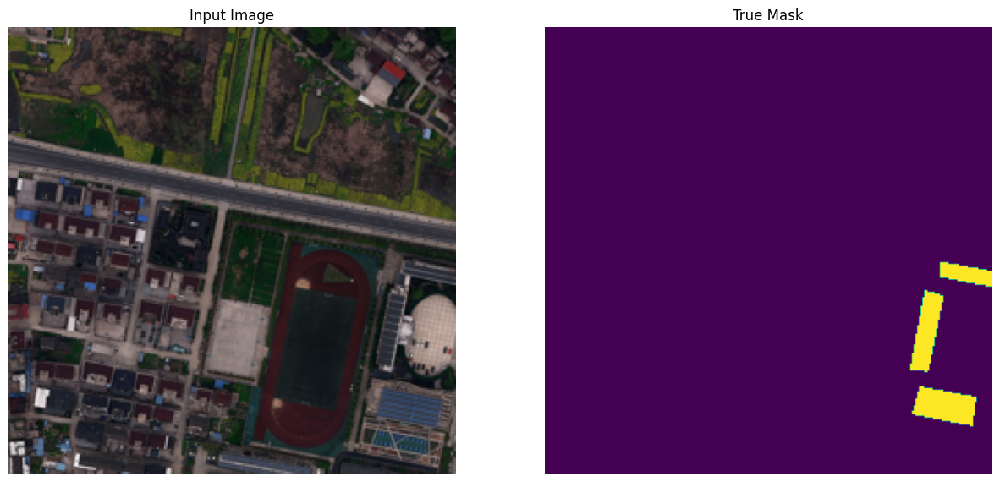

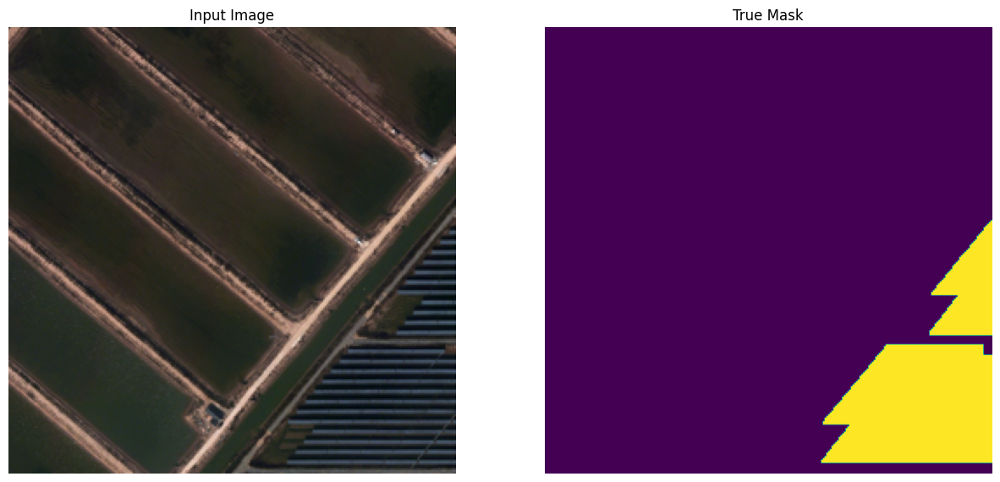

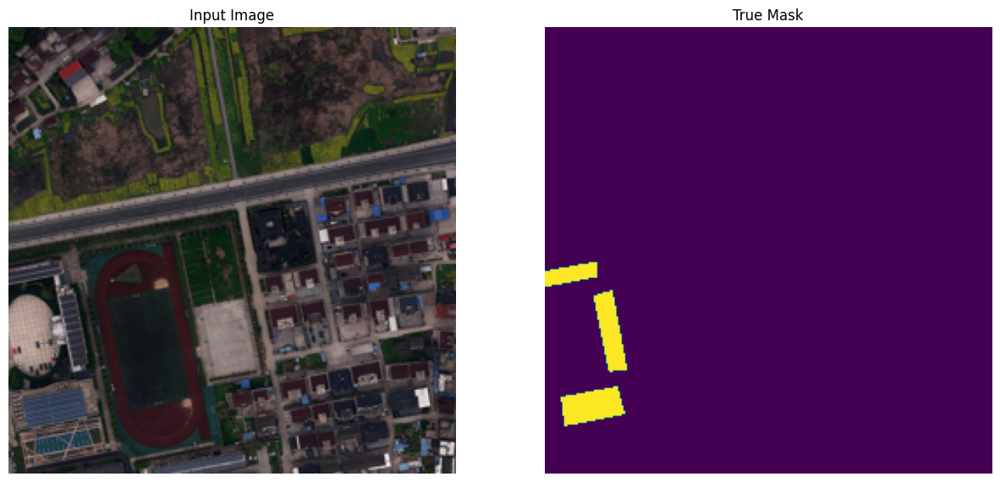

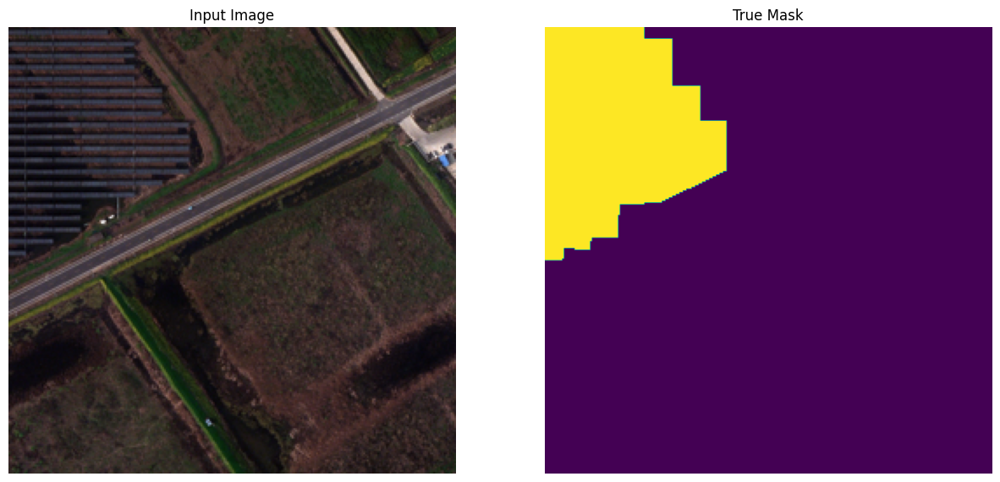

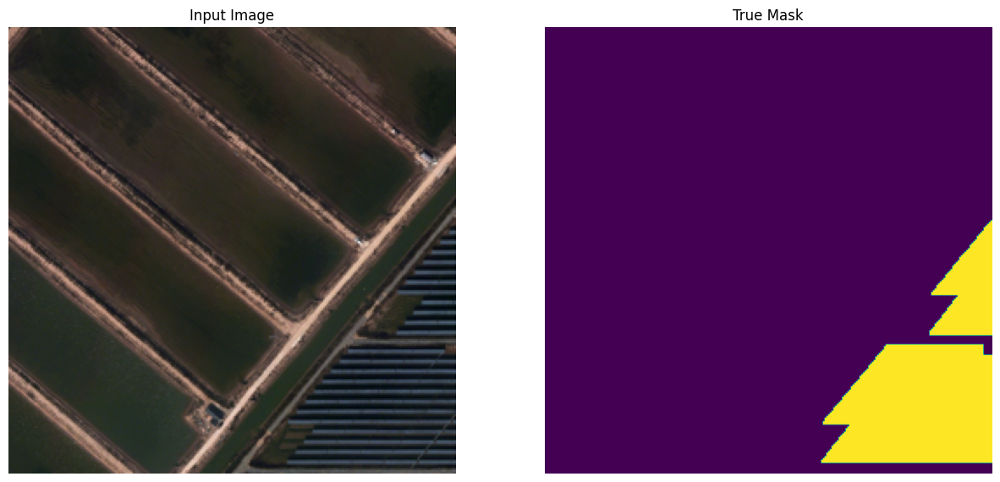

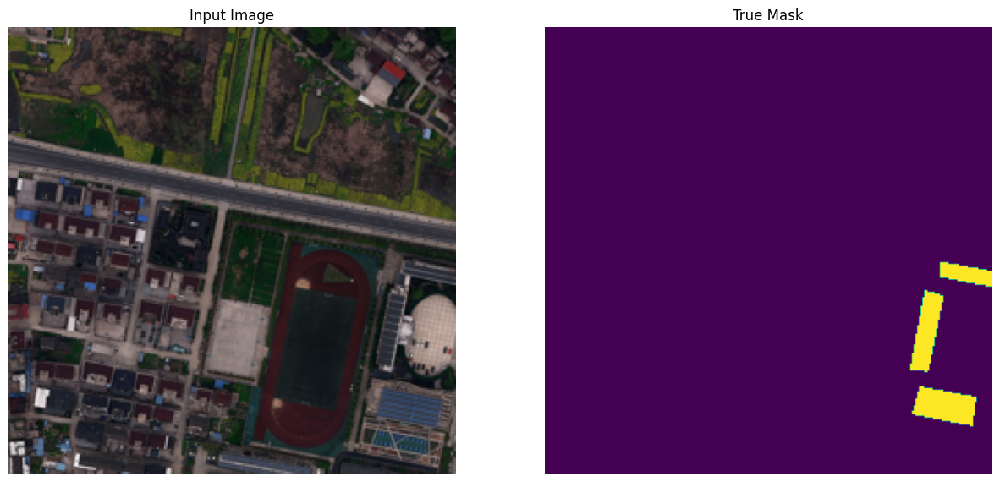

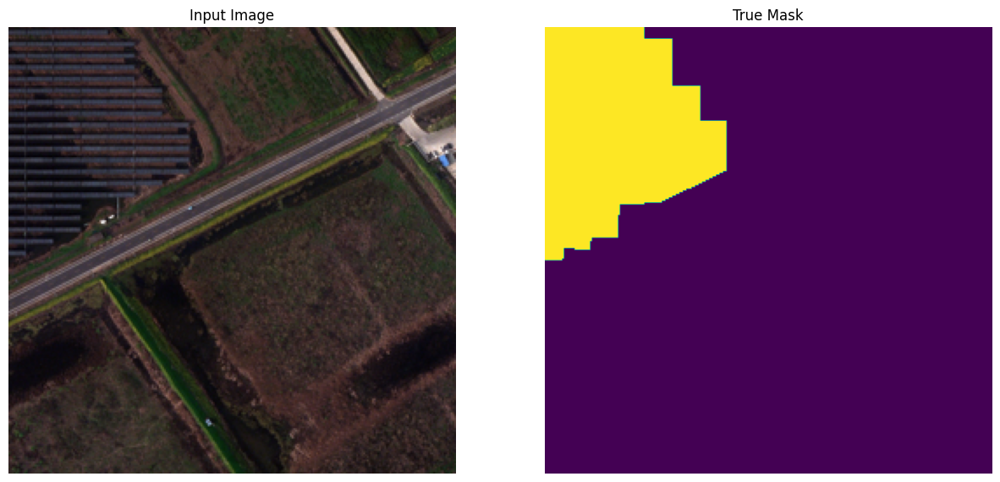

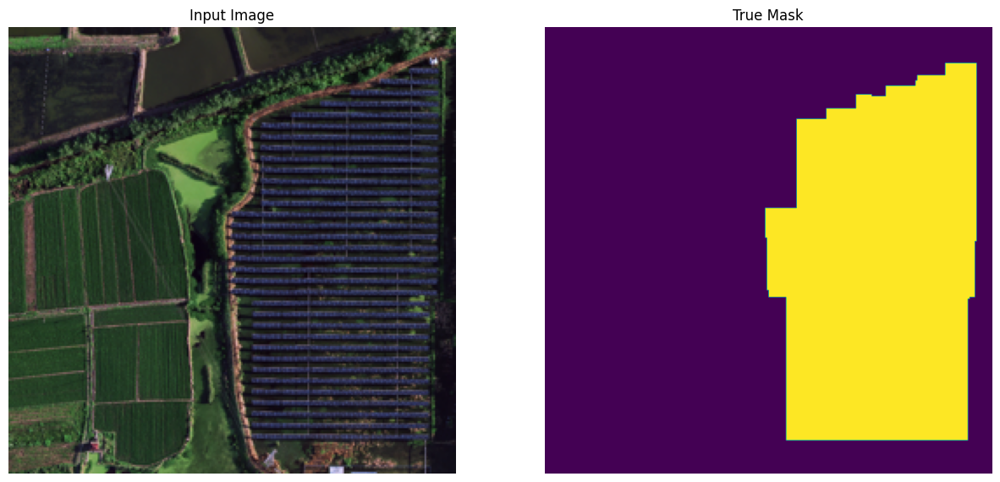

In [20]:
# Let's look the image and it's corresponding mask
for i in range(5):
    for image, mask in train.take(i):
        sample_image, sample_mask = image, mask
        display([sample_image, sample_mask])

# V. Model
---

We are going to use U-Net model. A U-Net consists of an encoder (downsampler) and decoder (upsampler). In-order to learn robust features, and reduce the number of trainable parameters, a pretrained model can be used as the encoder.The encoder will be a pretrained MobileNetV2 model which is prepared and ready to use in tf.keras.applications. 

In [21]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[256, 256, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)
down_stack.trainable = False

In [22]:
def upsample(filters, size, norm_type='batchnorm', apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    if norm_type.lower() == 'batchnorm':
        result.add(tf.keras.layers.BatchNormalization())
    elif norm_type.lower() == 'instancenorm':
        result.add(InstanceNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

        result.add(tf.keras.layers.ReLU())

    return result

up_stack = [
    upsample(512, 3),  # 4x4 -> 8x8
    upsample(256, 3),  # 8x8 -> 16x16
    upsample(128, 3),  # 16x16 -> 32x32
    upsample(64, 3),   # 32x32 -> 64x64
]

In [23]:
def unet_model(output_channels):
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    # Downsampling through the model
    skips = down_stack(inputs)
    x = skips[-1]
    skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        concat = tf.keras.layers.Concatenate()
        x = concat([x, skip])

  # This is the last layer of the model
    last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2, activation='sigmoid',
      padding='same')  #64x64 -> 128x128

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

# VI. Training the Model
___

Now let's compile the model and see the model architecture

In [24]:
def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)

def dice_loss(in_gt, in_pred):
    return 1-dice_coef(in_gt, in_pred)

model = unet_model(1)

model.compile(optimizer='adam',
              loss = dice_loss,
              metrics=[dice_coef,'binary_accuracy'])

tf.keras.utils.plot_model(model, show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [25]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


Let's try out the model to see what it predicts before training.

2024-07-15 09:18:01.531736: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


1/1 [==============================] - 2s 2s/step


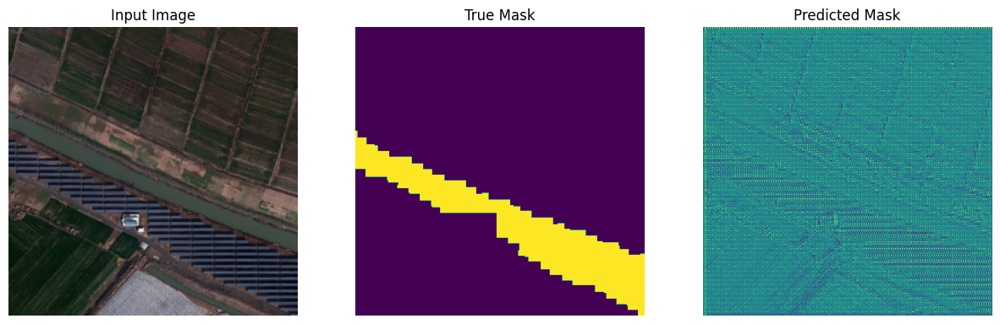

In [26]:
for images, masks in train_dataset.take(1):
    for img, mask in zip(images, masks):
        sample_image = img
        sample_mask = mask
        break
def visualize(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def show_predictions(sample_image, sample_mask):
    pred_mask = model.predict(sample_image[tf.newaxis, ...])
    pred_mask = pred_mask.reshape(img_size[0],img_size[1],1)
    visualize([sample_image, sample_mask, pred_mask])
    
show_predictions(sample_image, sample_mask)

In [27]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 model (Functional)             [(None, 128, 128, 9  1841984     ['input_2[0][0]']                
                                6),                                                               
                                 (None, 64, 64, 144                                               
                                ),                                                                
                                 (None, 32, 32, 192                                         

Epoch 1/30


2024-07-15 09:18:20.609389: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 150994944 exceeds 10% of free system memory.
2024-07-15 09:18:20.621160: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 153363456 exceeds 10% of free system memory.
2024-07-15 09:18:20.955942: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 106954752 exceeds 10% of free system memory.
2024-07-15 09:18:21.078491: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 251658240 exceeds 10% of free system memory.
2024-07-15 09:18:21.260797: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 251658240 exceeds 10% of free system memory.


72/72 [==============================] - 102s 1s/step - loss: 0.3085 - dice_coef: 0.6915 - binary_accuracy: 0.8956 - val_loss: 0.2132 - val_dice_coef: 0.7890 - val_binary_accuracy: 0.9414
Epoch 2/30
72/72 [==============================] - 100s 1s/step - loss: 0.1847 - dice_coef: 0.8143 - binary_accuracy: 0.9546 - val_loss: 0.1953 - val_dice_coef: 0.8087 - val_binary_accuracy: 0.9513
Epoch 3/30
72/72 [==============================] - 99s 1s/step - loss: 0.1680 - dice_coef: 0.8300 - binary_accuracy: 0.9568 - val_loss: 0.1872 - val_dice_coef: 0.8181 - val_binary_accuracy: 0.9540
Epoch 4/30
1/1 [==============================] - 0s 34ms/step


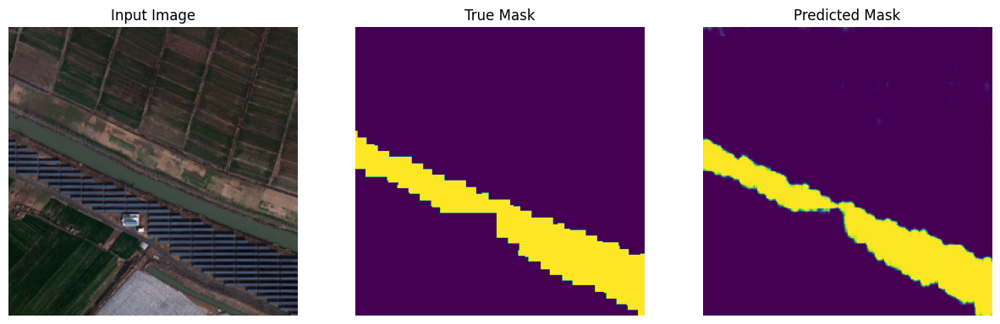

Epoch 5/30
72/72 [==============================] - 99s 1s/step - loss: 0.1568 - dice_coef: 0.8426 - binary_accuracy: 0.9575 - val_loss: 0.1851 - val_dice_coef: 0.8203 - val_binary_accuracy: 0.9546
Epoch 6/30
72/72 [==============================] - 99s 1s/step - loss: 0.1505 - dice_coef: 0.8502 - binary_accuracy: 0.9595 - val_loss: 0.1714 - val_dice_coef: 0.8331 - val_binary_accuracy: 0.9570
Epoch 7/30
72/72 [==============================] - 99s 1s/step - loss: 0.1462 - dice_coef: 0.8530 - binary_accuracy: 0.9581 - val_loss: 0.1770 - val_dice_coef: 0.8268 - val_binary_accuracy: 0.9553
Epoch 8/30
72/72 [==============================] - 100s 1s/step - loss: 0.1490 - dice_coef: 0.8481 - binary_accuracy: 0.9581 - val_loss: 0.1797 - val_dice_coef: 0.8254 - val_binary_accuracy: 0.9562
Epoch 9/30
1/1 [==============================] - 0s 35ms/step


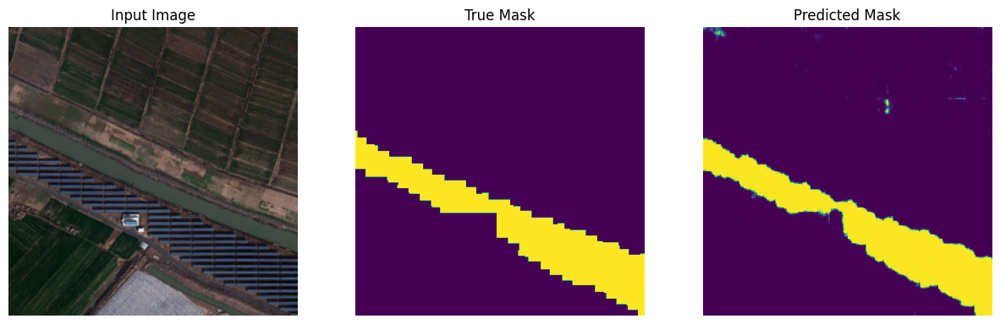

Epoch 10/30
72/72 [==============================] - 99s 1s/step - loss: 0.1407 - dice_coef: 0.8602 - binary_accuracy: 0.9603 - val_loss: 0.1744 - val_dice_coef: 0.8303 - val_binary_accuracy: 0.9577
Epoch 11/30
72/72 [==============================] - 99s 1s/step - loss: 0.1372 - dice_coef: 0.8633 - binary_accuracy: 0.9599 - val_loss: 0.1738 - val_dice_coef: 0.8313 - val_binary_accuracy: 0.9569
Epoch 12/30
72/72 [==============================] - 99s 1s/step - loss: 0.1420 - dice_coef: 0.8527 - binary_accuracy: 0.9592 - val_loss: 0.1670 - val_dice_coef: 0.8369 - val_binary_accuracy: 0.9580
Epoch 13/30
72/72 [==============================] - 99s 1s/step - loss: 0.1441 - dice_coef: 0.8533 - binary_accuracy: 0.9584 - val_loss: 0.1826 - val_dice_coef: 0.8208 - val_binary_accuracy: 0.9543
Epoch 14/30
1/1 [==============================] - 0s 34ms/step


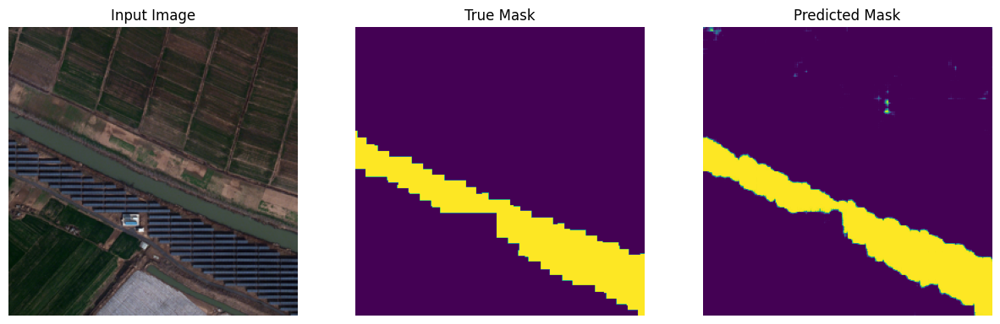

Epoch 15/30
72/72 [==============================] - 100s 1s/step - loss: 0.1431 - dice_coef: 0.8581 - binary_accuracy: 0.9589 - val_loss: 0.1718 - val_dice_coef: 0.8327 - val_binary_accuracy: 0.9572
Epoch 16/30
72/72 [==============================] - 100s 1s/step - loss: 0.1284 - dice_coef: 0.8713 - binary_accuracy: 0.9602 - val_loss: 0.1719 - val_dice_coef: 0.8323 - val_binary_accuracy: 0.9589


In [28]:
early_stop = tf.keras.callbacks.EarlyStopping(patience=4,restore_best_weights=True)

# Let's observe how the model improves while it is training. 
# To accomplish this task, a callback function is defined below.
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        if (epoch + 1) % 5 == 0:
            show_predictions(sample_image, sample_mask)
EPOCHS = 30
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_data=valid_dataset,
                          callbacks=[DisplayCallback(), early_stop])

# VI. Inferance
---

1/1 [==============================] - 0s 32ms/step


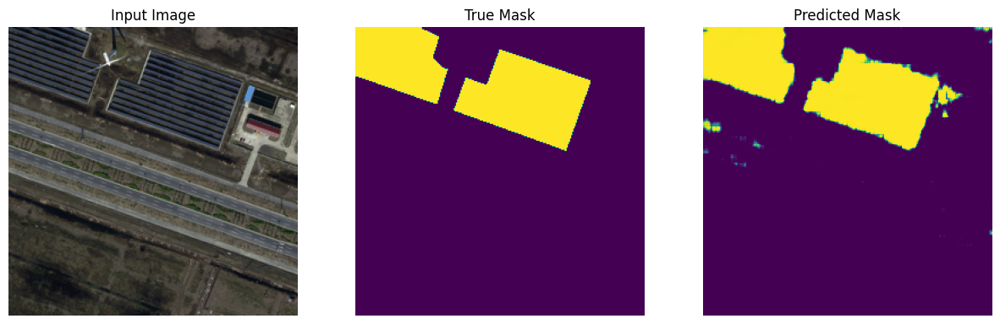

1/1 [==============================] - 0s 35ms/step


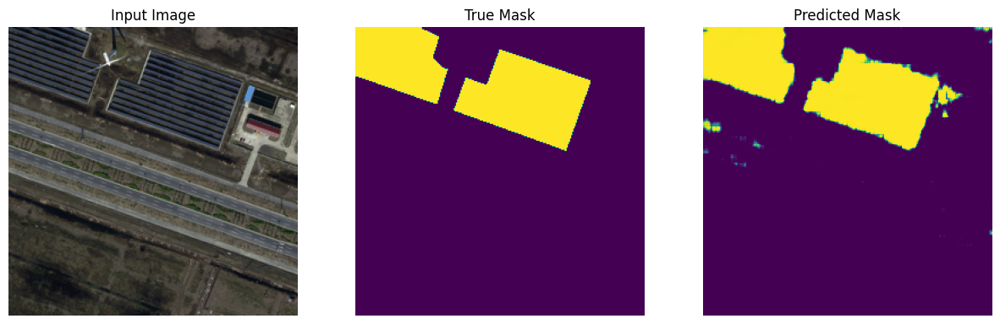

1/1 [==============================] - 0s 32ms/step


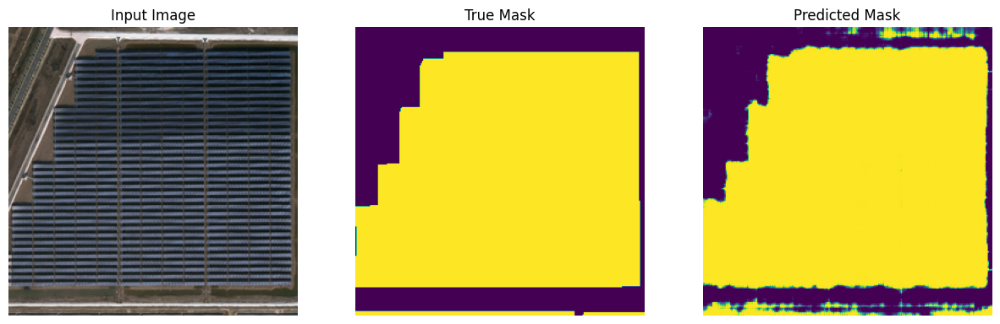

1/1 [==============================] - 0s 32ms/step


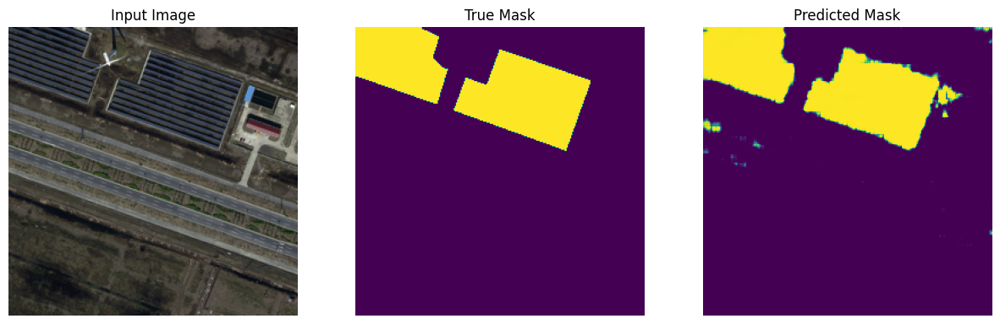

1/1 [==============================] - 0s 33ms/step


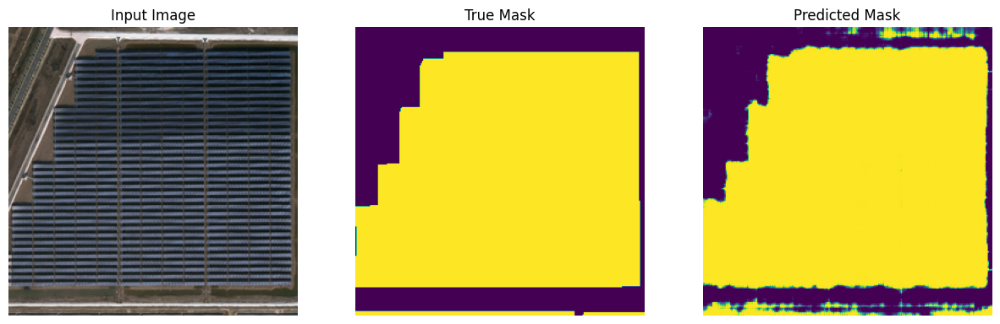

1/1 [==============================] - 0s 35ms/step


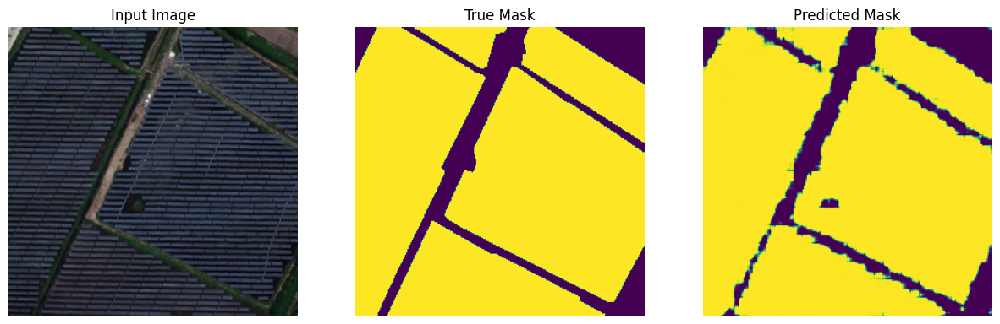

1/1 [==============================] - 0s 34ms/step


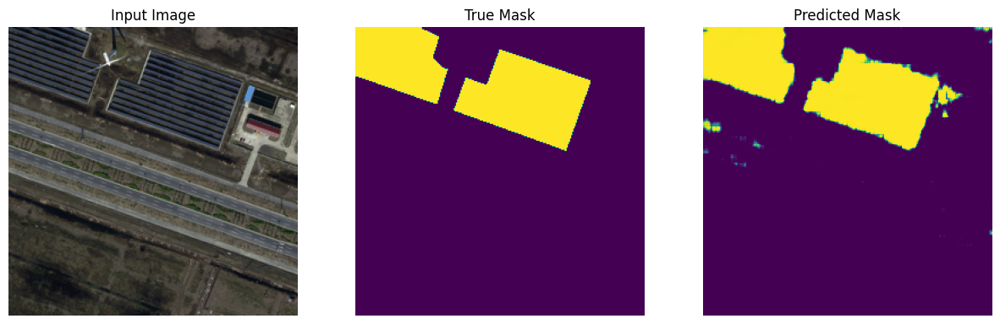

1/1 [==============================] - 0s 32ms/step


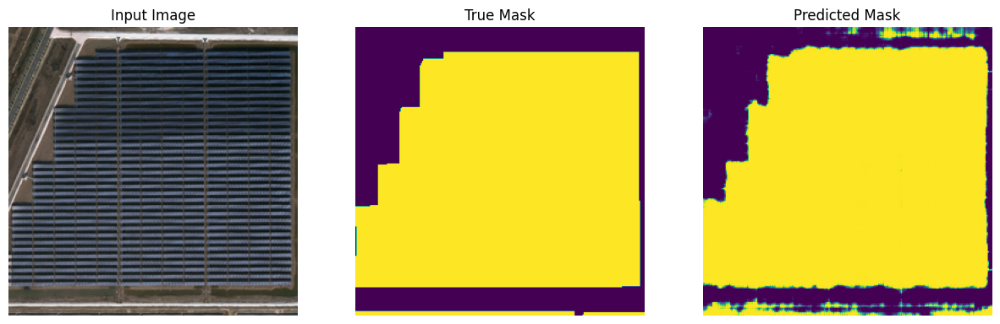

1/1 [==============================] - 0s 33ms/step


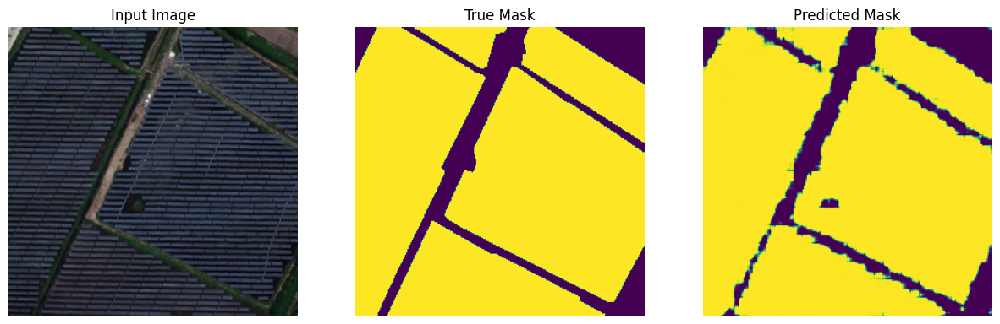

1/1 [==============================] - 0s 32ms/step


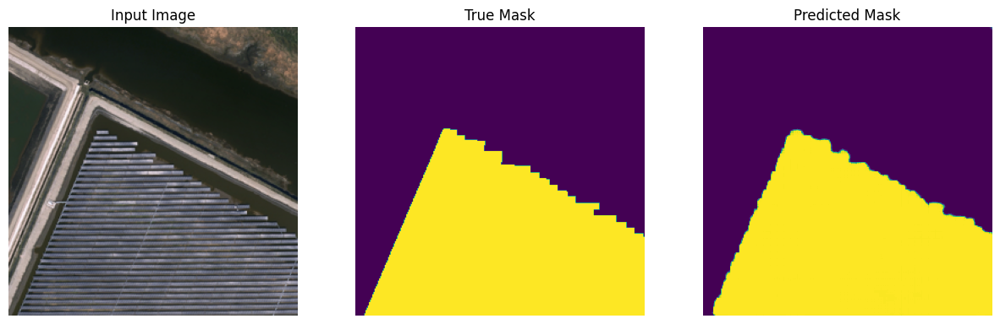

In [29]:
for i in range(5):
    for image, mask in valid.take(i):
        sample_image, sample_mask = image, mask
        show_predictions(sample_image, sample_mask)

# VI. Save and Load the Model 
---

In [30]:
model.save_weights("model.h5")
print("Saved model to disk")

Saved model to disk


In [31]:
def visualize_predicted(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def show_(sample_image):
    pred_mask = model.predict(sample_image[tf.newaxis, ...])
    pred_mask = pred_mask.reshape(img_size[0],img_size[1],1)
    visualize_predicted([sample_image, pred_mask])
    return pred_mask

1/1 [==============================] - 1s 534ms/step


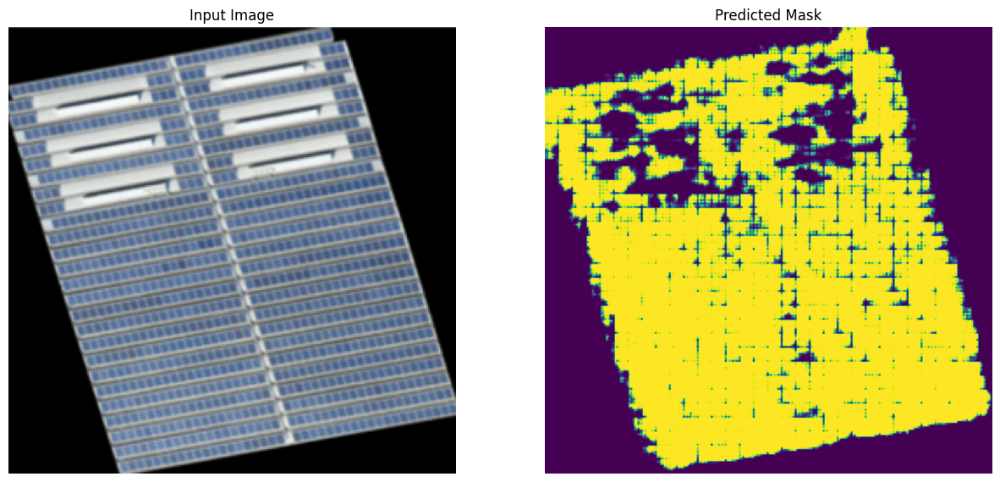

In [32]:
sample_image = Image.open('/home/jovyan/shared/Learning materials/subsections/1.*/code/data/kaggle_solar/PV03/input/2024-07-12 165425.png')
sample_image = sample_image.resize((256,256))
np_sample_image = np.array(sample_image.convert("RGB"))
pred_mask = show_(np_sample_image)

1/1 [==============================] - 0s 32ms/step


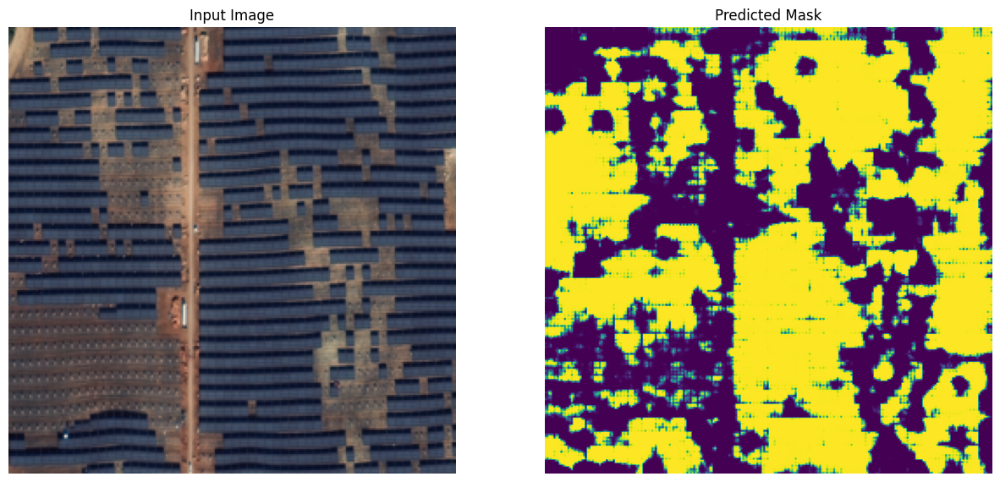

In [33]:
sample_image = Image.open('/home/jovyan/shared/Learning materials/subsections/1.*/code/data/kaggle_solar/PV03/input/1_1900x1000_Olmedilla-Solar-Panel-Farm-Spain.jpg')
sample_image = sample_image.resize((256,256))
np_sample_image = np.array(sample_image.convert("RGB"))
pred_mask = show_(np_sample_image)

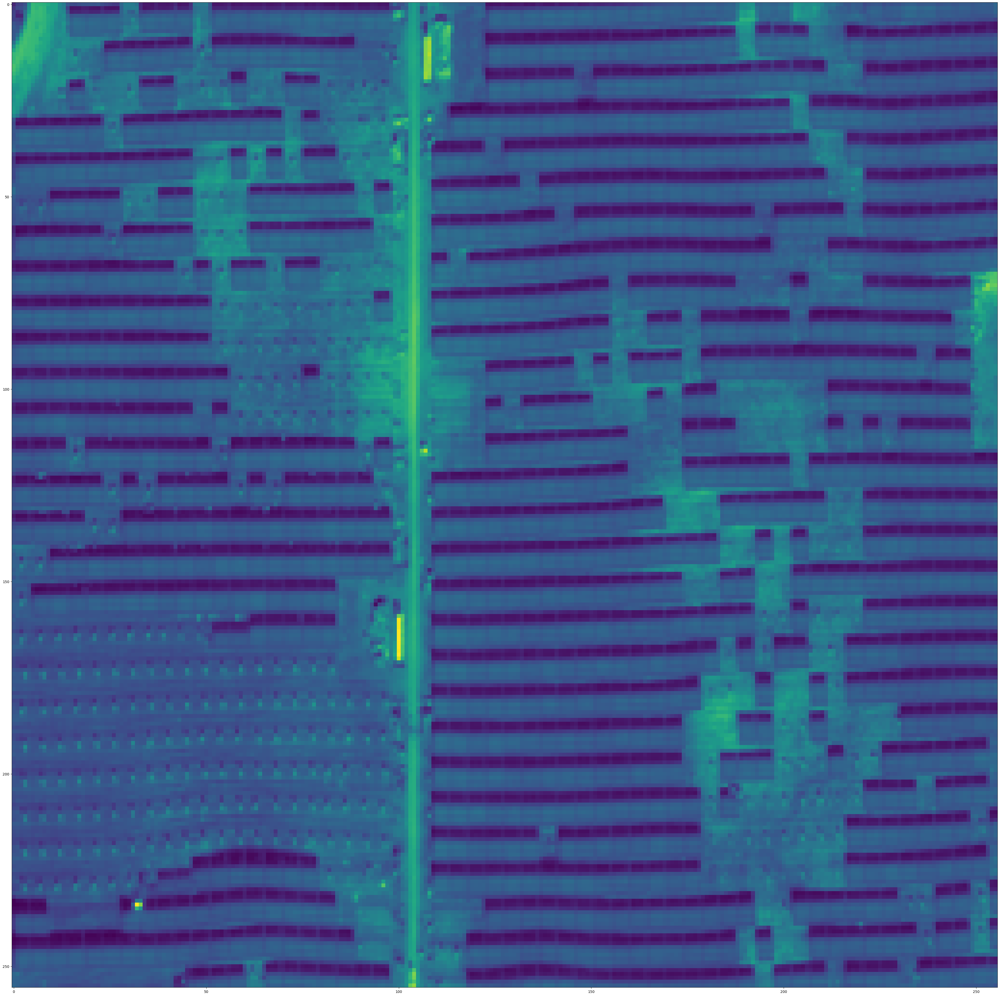

In [34]:
import cv2
gray = cv2.cvtColor(np_sample_image, cv2.COLOR_BGR2GRAY)
fig,ax = plt.subplots(1)
fig.set_size_inches(50, 50)
ax.imshow(gray)